In [2]:
import pandas as pd

In [3]:
%%capture
%run "/workspaces/CEA-1/análise de dados/dados_finais.ipynb"

In [ ]:
#dados = pd.read_csv("/workspaces/CEA-1/análise de dados/dados_completos.csv")
#linhas, colunas = dados.shape
#df = dados.copy()

In [4]:
import pandas as pd

# 1. Definindo a lista de colunas binárias
COLUNAS_BINARIAS = [
    'dor_abdominal', 'dor_no_corpo', 'artralgia', 'cefaleia', 'dor',
    'exantema_local', 'exantema', 'edema', 'eritema', 'calor', 'enduracao',
    'abscesso_quente', 'lesao', 'linfonodomegalia', 'prurido', 'febre',
    'nausea', 'emese', 'diarreia', 'tontura', 'sincope', 'parestesia',
    'convulsao', 'confusao_mental', 'fraqueza', 'hipotensao', 'taquicardia',
    'bradicardia', 'extremidades_frias', 'palidez', 'sudorese', 'urticaria',
    'broncoespasmo', 'dispneia', 'angioedema', 'tremor', 'fotofobia',
    'visao_turva', 'guillain_barre', 'encefalite', 'epilepsia', 'paralisia',
    'purpura_trombocitopenica', 'manifestacoes_locais', 'manifestacoes_sistemicas'
]

# 2. Tratamento de segurança: Garantir que as colunas sejam numéricas (0 e 1)
# O banco do SIPNI às vezes traz '1' como string ou dados nulos. 
# Transformamos tudo em numérico; o que for nulo vira 0 (assumindo ausência do sintoma).
for col in COLUNAS_BINARIAS:
    dados_finais[col] = pd.to_numeric(dados_finais[col], errors='coerce').fillna(0).astype(int)

# 3. O agrupamento mágico:
# Agrupamos pela variável resposta e somamos todas as colunas binárias.
contagem_sintomas = dados_finais.groupby('cls_fin_ajustada')[COLUNAS_BINARIAS].sum()

# 4. Transpor a tabela (opcional, mas altamente recomendado)
# Transpor (.T) coloca os sintomas nas linhas e a classificação (EANG, EAG) nas colunas.
# Fica muito mais fácil de ler e exportar para o Excel/Word da dissertação!
tabela_frequencia = contagem_sintomas.T

# 5. Adicionando uma coluna de Total (soma das linhas) e ordenando do sintoma mais comum para o menos comum
tabela_frequencia['Total_Geral'] = tabela_frequencia.sum(axis=1)
tabela_frequencia = tabela_frequencia.sort_values(by='Total_Geral', ascending=False)

# 6. Exibindo os resultados
print("=== CONTAGEM DE SINTOMAS POR CLASSIFICAÇÃO FINAL ===")
print(tabela_frequencia)

# Dica: Para exportar essa tabela limpa para Excel:
# tabela_frequencia.to_excel("sintomas_por_gravidade.xlsx")

=== CONTAGEM DE SINTOMAS POR CLASSIFICAÇÃO FINAL ===
cls_fin_ajustada          EAG  EANG  EI  EI - evento adverso  Inclassificável  \
manifestacoes_sistemicas   42   383   2                    2                6   
manifestacoes_locais       19   274   2                    2                4   
dor                        12   174   2                    2                3   
eritema                     9   141   1                    0                2   
edema                       7   126   0                    1                1   
febre                      15    96   1                    1                2   
cefaleia                   13    99   0                    1                0   
emese                      13    93   0                    1                1   
sincope                     7    95   1                    0                0   
palidez                     5    95   1                    0                1   
nausea                      8    80   0                 

In [3]:
coluna_resposta = ['cls_fin_ajustada']   # lista, não string
resposta = coluna_resposta[0]            # agora retorna 'cls_fin_ajustada' corretamente

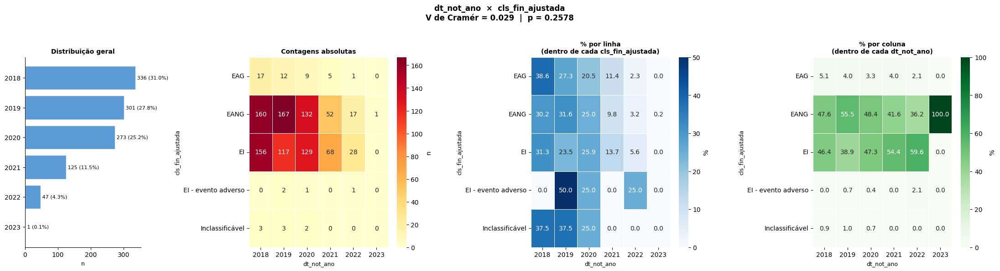

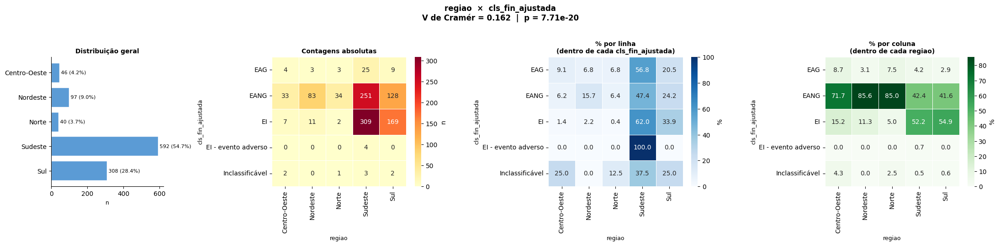

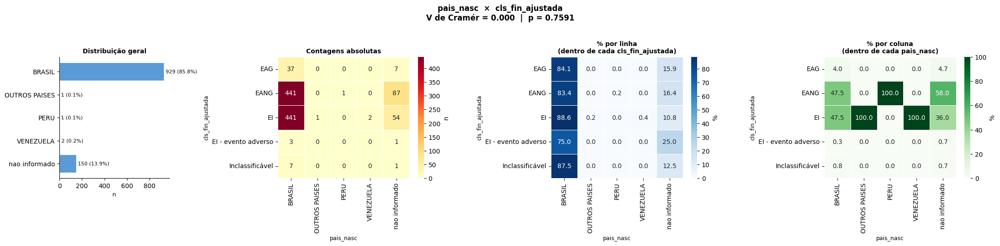

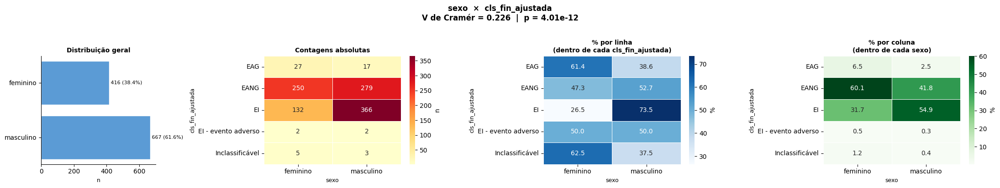

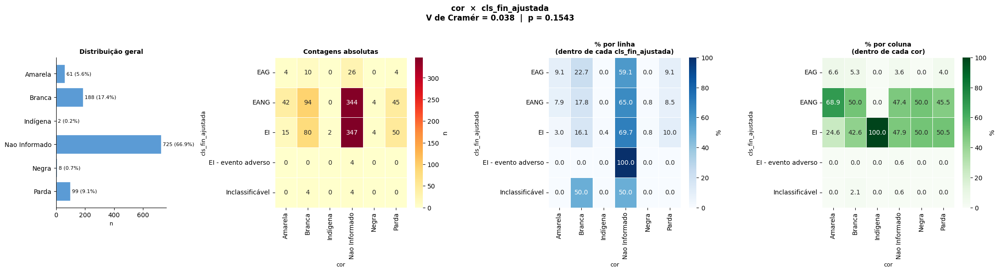

...

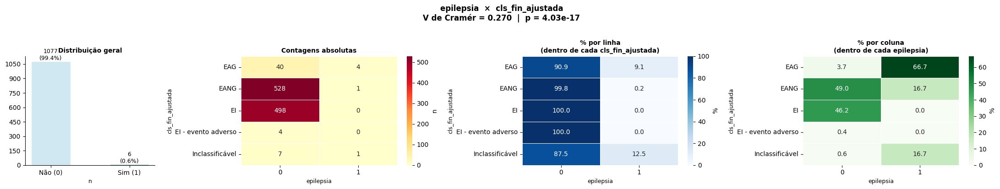

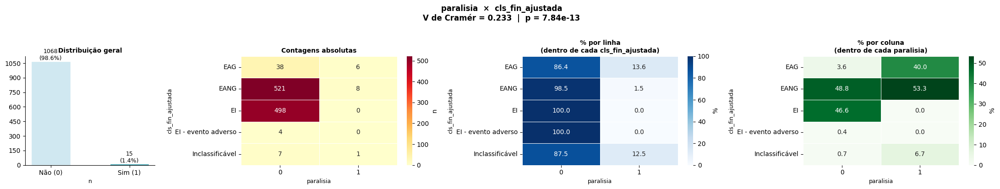

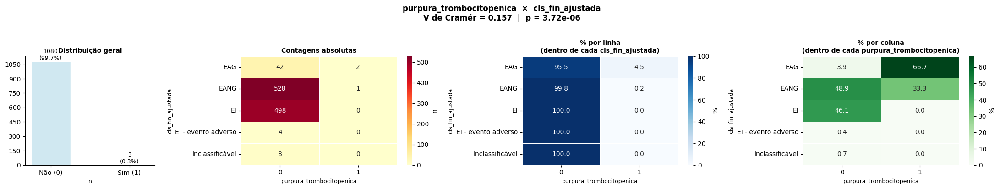

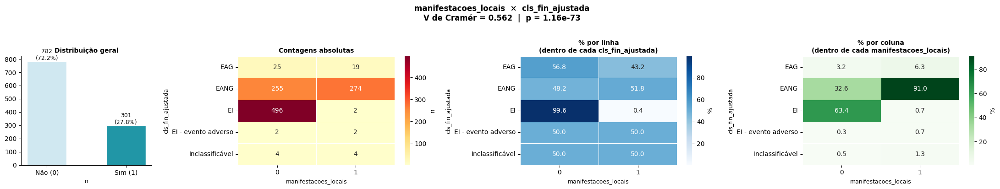

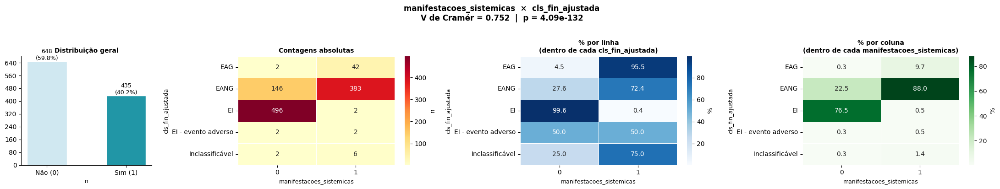

In [4]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

resposta       = coluna_resposta[0]
MAX_CATEGORIAS = 20
COLUNAS_BINARIAS = {
    'dor_abdominal', 'dor_no_corpo', 'artralgia', 'cefaleia', 'dor',
    'exantema_local', 'exantema', 'edema', 'eritema', 'calor', 'enduracao',
    'abscesso_quente', 'lesao', 'linfonodomegalia', 'prurido', 'febre',
    'nausea', 'emese', 'diarreia', 'tontura', 'sincope', 'parestesia',
    'convulsao', 'confusao_mental', 'fraqueza', 'hipotensao', 'taquicardia',
    'bradicardia', 'extremidades_frias', 'palidez', 'sudorese', 'urticaria',
    'broncoespasmo', 'dispneia', 'angioedema', 'tremor', 'fotofobia',
    'visao_turva', 'guillain_barre', 'encefalite', 'epilepsia', 'paralisia',
    'purpura_trombocitopenica', 'manifestacoes_locais', 'manifestacoes_sistemicas'
}

def cramers_v(tabela):
    chi2 = chi2_contingency(tabela, correction=False)[0]
    n    = tabela.sum().sum()
    if n == 0:
        return 0.0
    phi2 = chi2 / n
    r, k = tabela.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1)) / (n-1))
    rcorr    = r - ((r-1)**2) / (n-1)
    kcorr    = k - ((k-1)**2) / (n-1)
    denom    = min(kcorr-1, rcorr-1)
    return 0.0 if denom <= 0 else np.sqrt(phi2corr / denom)

COR_BINARIA = ['#d0e8f1', '#2196a6']
CMAP_ABS    = 'YlOrRd'
CMAP_LINHA  = 'Blues'
CMAP_COL    = 'Greens'

def plot_variavel_completo(col, dados_finais, resposta):
    n_cats = dados_finais[col].nunique()
    if n_cats > MAX_CATEGORIAS:
        print(f"Pulando '{col}': {n_cats} categorias (limite {MAX_CATEGORIAS})")
        return

    tab_abs = pd.crosstab(dados_finais[resposta], dados_finais[col])
    tab_lin = pd.crosstab(dados_finais[resposta], dados_finais[col], normalize='index') * 100
    tab_col = pd.crosstab(dados_finais[resposta], dados_finais[col], normalize='columns') * 100

    chi2_stat, p_val, dof, _ = chi2_contingency(tab_abs)
    v     = cramers_v(tab_abs.values)
    p_str = f"p = {p_val:.2e}" if p_val < 0.001 else f"p = {p_val:.4f}"  # ← forca e dof removidos

    fig, axes = plt.subplots(
        1, 4,
        figsize=(22, max(4, n_cats * 0.55 + 2.5)),
        gridspec_kw={'width_ratios': [2, 3, 3, 3]}
    )
    fig.suptitle(
        f"{col}  ×  {resposta}\n"
        f"V de Cramér = {v:.3f}  |  {p_str}",   # ← forca e gl removidos
        fontsize=12, fontweight='bold', y=1.02
    )

    ax = axes[0]
    if col in COLUNAS_BINARIAS:
        contagem = dados_finais[col].value_counts().sort_index()
        rotulos  = ['Não (0)', 'Sim (1)']
        vals     = [contagem.get(0, 0), contagem.get(1, 0)]
        bars     = ax.bar(rotulos, vals, color=COR_BINARIA, edgecolor='white', width=0.5)
        for bar in bars:
            h   = bar.get_height()
            pct = h / len(dados_finais) * 100
            ax.text(bar.get_x() + bar.get_width() / 2, h,
                    f"{int(h)}\n({pct:.1f}%)", ha='center', va='bottom', fontsize=9)
    else:
        contagem = dados_finais[col].value_counts().sort_index()
        bars     = ax.barh(contagem.index.astype(str), contagem.values,
                           color='#5B9BD5', edgecolor='white')
        total = contagem.sum()
        for bar, val in zip(bars, contagem.values):
            pct = val / total * 100
            ax.text(val, bar.get_y() + bar.get_height() / 2,
                    f" {int(val)} ({pct:.1f}%)", va='center', fontsize=8)
        ax.invert_yaxis()

    ax.set_title('Distribuição geral', fontsize=10, fontweight='bold', pad=6)
    ax.set_xlabel('n', fontsize=9)
    ax.spines[['top', 'right']].set_visible(False)
    ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True))

    sns.heatmap(tab_abs, annot=True, fmt='d', cmap=CMAP_ABS,
                cbar_kws={'label': 'n'}, ax=axes[1], linewidths=0.4, linecolor='white')
    axes[1].set_title('Contagens absolutas', fontsize=10, fontweight='bold', pad=6)
    axes[1].set_xlabel(col, fontsize=9)
    axes[1].set_ylabel(resposta, fontsize=9)

    sns.heatmap(tab_lin, annot=True, fmt='.1f', cmap=CMAP_LINHA,
                cbar_kws={'label': '%'}, ax=axes[2], linewidths=0.4, linecolor='white')
    axes[2].set_title(f'% por linha\n(dentro de cada {resposta})', fontsize=10, fontweight='bold', pad=6)
    axes[2].set_xlabel(col, fontsize=9)
    axes[2].set_ylabel(resposta, fontsize=9)

    sns.heatmap(tab_col, annot=True, fmt='.1f', cmap=CMAP_COL,
                cbar_kws={'label': '%'}, ax=axes[3], linewidths=0.4, linecolor='white')
    axes[3].set_title(f'% por coluna\n(dentro de cada {col})', fontsize=10, fontweight='bold', pad=6)
    axes[3].set_xlabel(col, fontsize=9)
    axes[3].set_ylabel(resposta, fontsize=9)

    plt.tight_layout()
    plt.show()
    plt.close(fig)   # ← bloco inteiro do salvar removido

for col in colunas_explicativas:
    plot_variavel_completo(col, dados_finais, resposta)

In [5]:
df_filtrado = df_filtrado.drop(columns=['cls_fin_ajustada'])

In [6]:
coluna_resposta = ['cls_fin_reg_logistica']   # lista, não string
resposta = coluna_resposta[0]            # agora retorna 'cls_fin_ajustada' corretamente

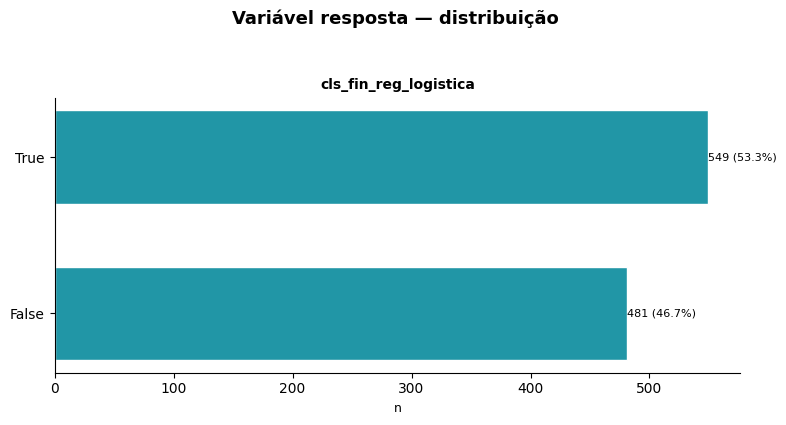

In [7]:
def plot_categorica(col, ax, max_cats=15):
    contagem = df_filtrado[col].value_counts().head(max_cats)
    bars = ax.barh(
        contagem.index.astype(str)[::-1],
        contagem.values[::-1],
        color='#2196a6', edgecolor='white', height=0.6
    )
    for bar in bars:
        w = bar.get_width()
        pct = w / len(df_filtrado) * 100
        ax.text(w + 0.3, bar.get_y() + bar.get_height() / 2,
                f'{int(w)} ({pct:.1f}%)', va='center', fontsize=8)
    ax.set_title(col, fontsize=10, fontweight='bold', pad=6)
    ax.set_xlabel('n', fontsize=9)
    ax.spines[['top', 'right']].set_visible(False)

# ── variável resposta ────────────────────────────────────────────────────────
n_resp = len(coluna_resposta)
# Se houver apenas 1 variável, cria 1 coluna. Se houver mais, usa 2 colunas.
ncols_resp = 1 if n_resp == 1 else 2
nrows_resp = -(-n_resp // ncols_resp)

# Ajusta o tamanho da figura dinamicamente
fig3, axes3 = plt.subplots(nrows_resp, ncols_resp, figsize=(8 * ncols_resp, nrows_resp * 4))

# Garante que axes3 seja uma lista iterável mesmo se for um gráfico único (1x1)
if n_resp == 1:
    axes3 = [axes3]
else:
    axes3 = axes3.flatten()

for i, col in enumerate(coluna_resposta):
    plot_categorica(col, axes3[i])

# Esconde os eixos vazios extras (se houver)
for j in range(len(coluna_resposta), len(axes3)):
    axes3[j].set_visible(False)

fig3.suptitle('Variável resposta — distribuição', fontsize=13, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

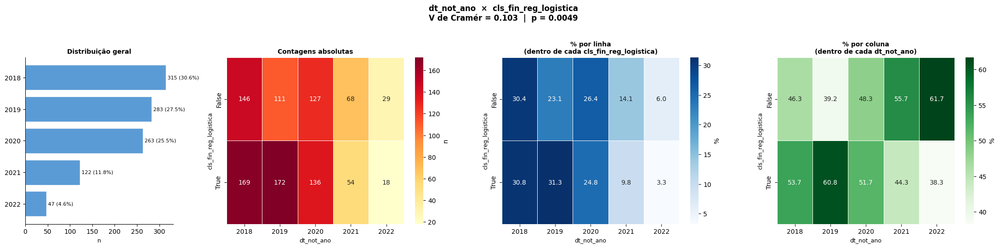

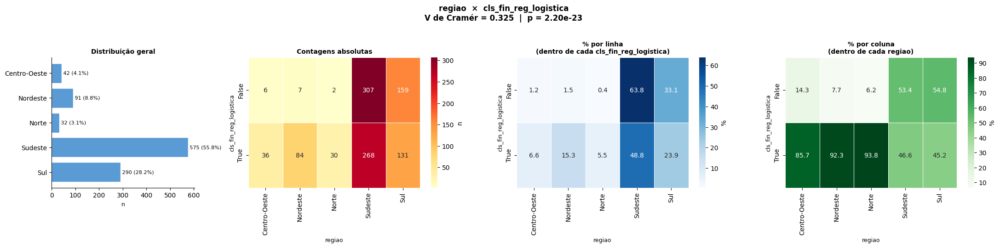

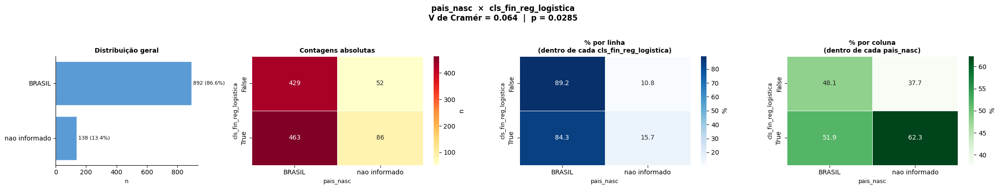

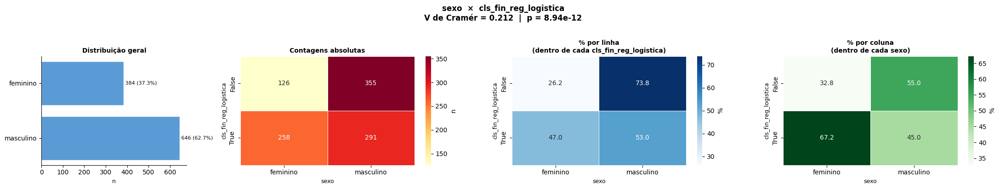

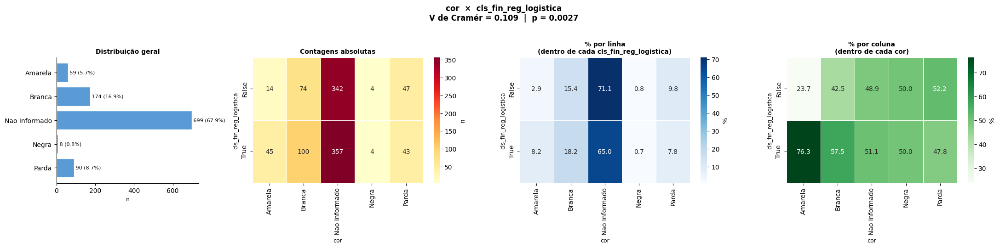

...

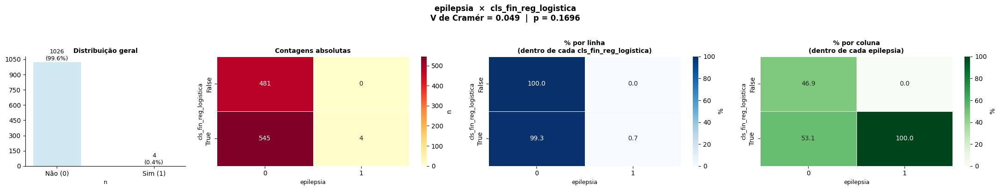

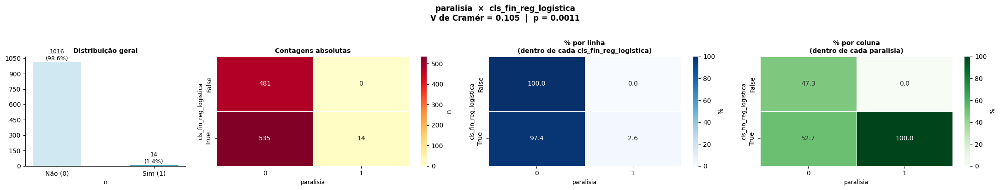

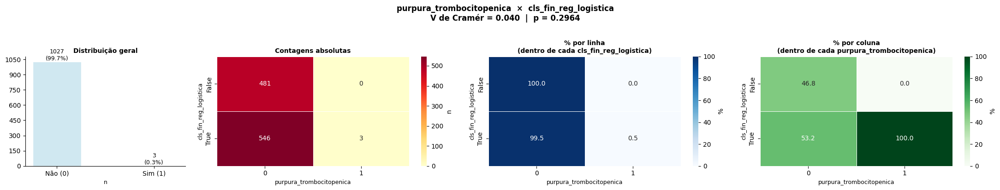

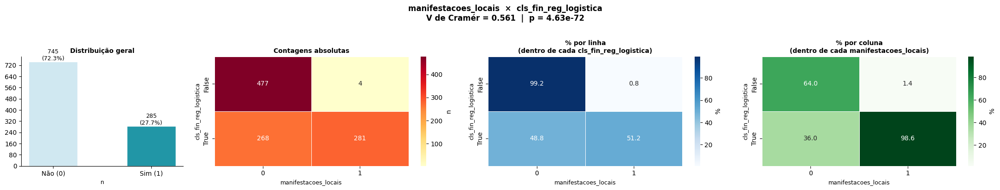

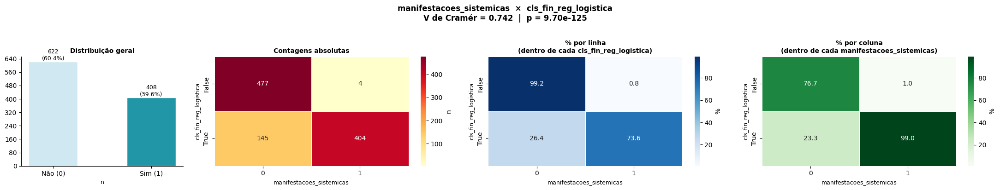

In [8]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

resposta       = coluna_resposta[0]
MAX_CATEGORIAS = 20
COLUNAS_BINARIAS = {
    'dor_abdominal', 'dor_no_corpo', 'artralgia', 'cefaleia', 'dor',
    'exantema_local', 'exantema', 'edema', 'eritema', 'calor', 'enduracao',
    'abscesso_quente', 'lesao', 'linfonodomegalia', 'prurido', 'febre',
    'nausea', 'emese', 'diarreia', 'tontura', 'sincope', 'parestesia',
    'convulsao', 'confusao_mental', 'fraqueza', 'hipotensao', 'taquicardia',
    'bradicardia', 'extremidades_frias', 'palidez', 'sudorese', 'urticaria',
    'broncoespasmo', 'dispneia', 'angioedema', 'tremor', 'fotofobia',
    'visao_turva', 'guillain_barre', 'encefalite', 'epilepsia', 'paralisia',
    'purpura_trombocitopenica', 'manifestacoes_locais', 'manifestacoes_sistemicas'
}

def cramers_v(tabela):
    chi2 = chi2_contingency(tabela, correction=False)[0]
    n    = tabela.sum().sum()
    if n == 0:
        return 0.0
    phi2 = chi2 / n
    r, k = tabela.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1)) / (n-1))
    rcorr    = r - ((r-1)**2) / (n-1)
    kcorr    = k - ((k-1)**2) / (n-1)
    denom    = min(kcorr-1, rcorr-1)
    return 0.0 if denom <= 0 else np.sqrt(phi2corr / denom)

COR_BINARIA = ['#d0e8f1', '#2196a6']
CMAP_ABS    = 'YlOrRd'
CMAP_LINHA  = 'Blues'
CMAP_COL    = 'Greens'

def plot_variavel_completo(col, df_filtrado, resposta):
    n_cats = df_filtrado[col].nunique()
    if n_cats > MAX_CATEGORIAS:
        print(f"Pulando '{col}': {n_cats} categorias (limite {MAX_CATEGORIAS})")
        return

    tab_abs = pd.crosstab(df_filtrado[resposta], df_filtrado[col])
    tab_lin = pd.crosstab(df_filtrado[resposta], df_filtrado[col], normalize='index') * 100
    tab_col = pd.crosstab(df_filtrado[resposta], df_filtrado[col], normalize='columns') * 100

    chi2_stat, p_val, dof, _ = chi2_contingency(tab_abs)
    v     = cramers_v(tab_abs.values)
    p_str = f"p = {p_val:.2e}" if p_val < 0.001 else f"p = {p_val:.4f}"

    fig, axes = plt.subplots(
        1, 4,
        figsize=(22, max(4, n_cats * 0.55 + 2.5)),
        gridspec_kw={'width_ratios': [2, 3, 3, 3]}
    )
    fig.suptitle(
        f"{col}  ×  {resposta}\n"
        f"V de Cramér = {v:.3f}  |  {p_str}",
        fontsize=12, fontweight='bold', y=1.02
    )

    ax = axes[0]
    if col in COLUNAS_BINARIAS:
        contagem = df_filtrado[col].value_counts().sort_index()
        rotulos  = ['Não (0)', 'Sim (1)']
        vals     = [contagem.get(0, 0), contagem.get(1, 0)]
        bars     = ax.bar(rotulos, vals, color=COR_BINARIA, edgecolor='white', width=0.5)
        for bar in bars:
            h   = bar.get_height()
            pct = h / len(df_filtrado) * 100
            ax.text(bar.get_x() + bar.get_width() / 2, h,
                    f"{int(h)}\n({pct:.1f}%)", ha='center', va='bottom', fontsize=9)
    else:
        contagem = df_filtrado[col].value_counts().sort_index()
        bars     = ax.barh(contagem.index.astype(str), contagem.values,
                           color='#5B9BD5', edgecolor='white')
        total = contagem.sum()
        for bar, val in zip(bars, contagem.values):
            pct = val / total * 100
            ax.text(val, bar.get_y() + bar.get_height() / 2,
                    f" {int(val)} ({pct:.1f}%)", va='center', fontsize=8)
        ax.invert_yaxis()

    ax.set_title('Distribuição geral', fontsize=10, fontweight='bold', pad=6)
    ax.set_xlabel('n', fontsize=9)
    ax.spines[['top', 'right']].set_visible(False)
    ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True))

    sns.heatmap(tab_abs, annot=True, fmt='d', cmap=CMAP_ABS,
                cbar_kws={'label': 'n'}, ax=axes[1], linewidths=0.4, linecolor='white')
    axes[1].set_title('Contagens absolutas', fontsize=10, fontweight='bold', pad=6)
    axes[1].set_xlabel(col, fontsize=9)
    axes[1].set_ylabel(resposta, fontsize=9)

    sns.heatmap(tab_lin, annot=True, fmt='.1f', cmap=CMAP_LINHA,
                cbar_kws={'label': '%'}, ax=axes[2], linewidths=0.4, linecolor='white')
    axes[2].set_title(f'% por linha\n(dentro de cada {resposta})', fontsize=10, fontweight='bold', pad=6)
    axes[2].set_xlabel(col, fontsize=9)
    axes[2].set_ylabel(resposta, fontsize=9)

    sns.heatmap(tab_col, annot=True, fmt='.1f', cmap=CMAP_COL,
                cbar_kws={'label': '%'}, ax=axes[3], linewidths=0.4, linecolor='white')
    axes[3].set_title(f'% por coluna\n(dentro de cada {col})', fontsize=10, fontweight='bold', pad=6)
    axes[3].set_xlabel(col, fontsize=9)
    axes[3].set_ylabel(resposta, fontsize=9)

    plt.tight_layout()
    plt.show()
    plt.close(fig)

for col in colunas_explicativas:
    plot_variavel_completo(col, df_filtrado, resposta)